<a href="https://colab.research.google.com/github/aml-2023/final-project/blob/main/detr_object_detection_finetuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Fine-tuning DETR on a custom dataset for object detection

In this notebook, we are going to fine-tune [DETR](https://huggingface.co/docs/transformers/model_doc/detr) (end-to-end object detection with Transformers) on a garbage object detection dataset. The goal for the model is to detect garbage in pictures.

* Original DETR paper: https://arxiv.org/abs/2005.12872
* Original DETR repo: https://github.com/facebookresearch/detr

### Note regarding GPU memory

`DetrImageProcessor` by default resizes each image to have a `min_size` of 800 pixels and a `max_size` of 1333 pixels (as these are the default values that DETR uses at *inference* time). Note that this can stress-test the memory of your GPU when *training* the model, as the images are flattened after sent through the convolutional backbone. The sequence length that is sent through the Transformer is typically of length (height*width/32^2). So if you consider an image of size (900, 900) for example, the sequence length is 900^2/32^2 = 791, which is larger than what NLP models like BERT use (512). It's advised to use a batch size of 2 on a single GPU. You can of course also initialize `DetrImageProcessor` with a smaller `size` and/or `max_size` to use bigger batches.


### Note regarding data augmentation

DETR actually uses several image augmentations during training. One of them is **scale augmentation**: they set the `min_size` randomly to be one of [480, 512, 544, 576, 608, 640, 672, 704, 736, 768, 800] as can be seen [here](https://github.com/facebookresearch/detr/blob/a54b77800eb8e64e3ad0d8237789fcbf2f8350c5/datasets/coco.py#L122). However, we are not going to add any of the augmentations that are used in the original implementation during training. It works fine without them.

### Training framework

We're going to fine-tune the model using [PyTorch Lightning](https://lightning.ai/pages/open-source/), but of course you could also train the model using native PyTorch, the 🤗 [Trainer](https://huggingface.co/docs/transformers/main_classes/trainer) class, 🤗 [Accelerate](https://huggingface.co/docs/accelerate/index), or any other framework you prefer.


## Install Requirements

As a first step, we will download the `requirements.txt` file from the github repo and install all the needed packages.

In [ ]:
!wget -O requirements.txt https://raw.githubusercontent.com/aml-2023/final-project/detr/requirements.txt
!pip install -q -r requirements.txt

## Fetch Data
The garbage dataset comes in the COCO format, which the `DetrImageProcessor` class can use directly. First, we download the `fetch_data.sh` script from the github repo and then after running it, we will have all of the data inside a `data/` folder.

In [ ]:
!wget -O fetch_data.sh https://raw.githubusercontent.com/aml-2023/final-project/detr/fetch_data.sh
!bash fetch_data.sh

## Connect to the DERT github repository

And import from it the needed modules

In [ ]:
!git clone https://github.com/facebookresearch/detr.git


import sys
sys.path.append('./detr/')

from detr.models.matcher import HungarianMatcher
from detr.models.detr import SetCriterion

## Create PyTorch dataset + dataloaders

The standard way in PyTorch to train a model is by creating datasets and a corresponding dataloaders. See [this guide](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html) if you're not familiar with them.

Here we define a regular PyTorch dataset. Each item of the dataset is an image and corresponding annotations. Torchvision already provides a `CocoDetection` dataset, which we can use. We only add an image processor (`DetrImageProcessor`) to resize + normalize the images, and to turn the annotations (which are in COCO format) in the format that DETR expects. It will also resize the annotations accordingly.

In [ ]:
import torchvision
import torch
import os

class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(self, img_folder, processor, train=True):
        ann_file = os.path.join(img_folder, "_annotations.coco.json")
        super(CocoDetection, self).__init__(img_folder, ann_file)
        self.processor = processor

    def __getitem__(self, idx):
        # read in PIL image and target in COCO format
        # feel free to add data augmentation here before passing them to the next step
        img, target = super(CocoDetection, self).__getitem__(idx)

        # preprocess image and target (converting target to DETR format, resizing + normalization of both image and target)
        image_id = self.ids[idx]
        target = {'image_id': image_id, 'annotations': target}
        encoding = self.processor(images=img, annotations=target, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze() # remove batch dimension
        target = encoding["labels"][0] # remove batch dimension

        return pixel_values, target

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

Based on the class defined above, we create training, validation, and test datasets.

---



In [ ]:
from transformers import DetrImageProcessor

processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")

train_dataset = CocoDetection(img_folder='data/train', processor=processor)
val_dataset = CocoDetection(img_folder='data/valid', processor=processor, train=False)
test_dataset = CocoDetection(img_folder='data/test', processor=processor, train=False)

As you can see, this dataset is tiny:

In [ ]:
print("Number of training examples:", len(train_dataset))
print("Number of validation examples:", len(val_dataset))
print("Number of test examples:", len(test_dataset))

Number of training examples: 3027
Number of validation examples: 306
Number of test examples: 201


Let's verify an example by visualizing it. We can access the COCO API of the dataset by typing `train_dataset.coco`.

Image n°1608


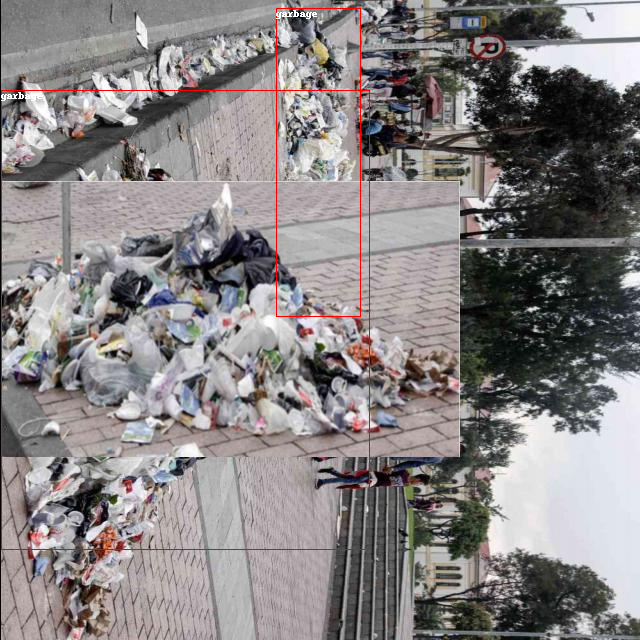

In [ ]:
import numpy as np
import os
from PIL import Image, ImageDraw

# based on https://github.com/woctezuma/finetune-detr/blob/master/finetune_detr.ipynb
image_ids = train_dataset.coco.getImgIds()
# let's pick a random image
image_id = image_ids[np.random.randint(0, len(image_ids))]
print('Image n°{}'.format(image_id))
image = train_dataset.coco.loadImgs(image_id)[0]
image = Image.open(os.path.join('data/train', image['file_name']))

annotations = train_dataset.coco.imgToAnns[image_id]
draw = ImageDraw.Draw(image, "RGBA")

cats = train_dataset.coco.cats
id2label = {k: v['name'] for k,v in cats.items()}

for annotation in annotations:
  box = annotation['bbox']
  class_idx = annotation['category_id']
  x,y,w,h = tuple(box)
  draw.rectangle((x,y,x+w,y+h), outline='red', width=1)
  draw.text((x, y), id2label[class_idx], fill='white')

image

Next, let's create corresponding PyTorch dataloaders, which allow us to get batches of data. We define a custom `collate_fn` to batch images together. As DETR resizes images to have a min size of 800 and a max size of 1333, images can have different sizes. We pad images (`pixel_values`) to the largest image in a batch, and create a corresponding `pixel_mask` to indicate which pixels are real (1)/which are padding (0).  

In [ ]:
from torch.utils.data import DataLoader

def collate_fn(batch):
  pixel_values = [item[0] for item in batch]
  encoding = processor.pad(pixel_values, return_tensors="pt")
  labels = [item[1] for item in batch]
  batch = {}
  batch['pixel_values'] = encoding['pixel_values']
  batch['pixel_mask'] = encoding['pixel_mask']
  batch['labels'] = labels
  return batch

train_dataloader = DataLoader(train_dataset, collate_fn=collate_fn, batch_size=4, shuffle=True)
val_dataloader = DataLoader(val_dataset, collate_fn=collate_fn, batch_size=2)
test_dataloader = DataLoader(test_dataset, collate_fn=collate_fn, batch_size=2)
batch = next(iter(train_dataloader))

## Subsetting the Data
We don't need to fine tune the model on all of the data, it is enough to just take a small part of it. This also helps with speeding up the training immensely.

As a start, we take only 10% of images.

In [ ]:
train_subset_size = int(0.1 * len(train_dataset))

# randomly sample 10% of indeces
train_subset_idx = np.random.randint(low=0, high=len(train_dataset), size=(train_subset_size))
trainset_subset = torch.utils.data.Subset(train_dataset, train_subset_idx)
train_subset_loader = DataLoader(trainset_subset, collate_fn=collate_fn, batch_size=4, shuffle=True)
batch = next(iter(train_subset_loader))

In [ ]:
val_subset_size = int(0.1 * len(val_dataset))

# randomly sample 10% of indeces
val_subset_idx = np.random.randint(low=0, high=len(val_dataset), size=(val_subset_size))
val_subset = torch.utils.data.Subset(val_dataset, val_subset_idx)
val_subset_loader = DataLoader(val_subset, collate_fn=collate_fn, batch_size=2)

In [ ]:
test_subset_size = int(0.1 * len(test_dataset))

# randomly sample 10% of indeces
test_subset_idx = np.random.randint(low=0, high=len(test_dataset), size=(test_subset_size))
test_subset = torch.utils.data.Subset(test_dataset, test_subset_idx)
test_subset_loader = DataLoader(test_subset, collate_fn=collate_fn, batch_size=2)

Let's verify the keys of a single batch:

In [ ]:
batch.keys()

dict_keys(['pixel_values', 'pixel_mask', 'labels'])

Let's verify the shape of the `pixel_values`, and check the `target`::

In [ ]:
pixel_values, target = train_dataset[0]

In [ ]:
pixel_values.shape

torch.Size([3, 800, 800])

In [ ]:
print(target.keys())

dict_keys(['size', 'image_id', 'class_labels', 'boxes', 'area', 'iscrowd', 'orig_size'])


# Train the model

In order to finetune the model we will download the pretrained version from
torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)

Ad mainly follow and adapt [this](https://www.kaggle.com/code/tanulsingh077/end-to-end-object-detection-with-transformers-detr) kaggle notebook.

#### Model definition

In [ ]:
import torch.nn as nn
import matplotlib.pyplot as plt

class DETRModel(nn.Module):
    def __init__(self,num_classes,num_queries):
        super(DETRModel,self).__init__()
        self.num_classes = num_classes
        self.num_queries = num_queries

        # Load the pretrained model
        self.model = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)
        self.in_features = self.model.class_embed.in_features

        # Create a new layer for the classification part of the DETR
        self.model.class_embed = nn.Linear(in_features=self.in_features,out_features=self.num_classes)
        self.model.num_queries = self.num_queries

    def forward(self,images):
        return self.model(images)


seed = 42
num_classes = 2
num_queries = 100
null_class_coef = 0.5
BATCH_SIZE = 8
LR = 2e-5
EPOCHS = 25

model = DETRModel(num_classes, num_queries)

Class that defines the object that will compute the average losses and metrics

In [ ]:
class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

Training and evaluation (over the validation set) functions

In [ ]:
def eval_fn(data_loader, model, criterion, device):

    model.eval()
    criterion.eval()
    summary_loss = AverageMeter()
    mapping_keys = {'size': 'size', 'image_id': 'image_id',
                    'class_labels': 'labels', 'boxes': 'boxes',
                     'area':  'area', 'iscrowd': 'iscrowd',
                    'orig_size': 'orig_size'}

    with torch.no_grad():
      for batch_idx, batch in enumerate(data_loader):
          batch_images = batch['pixel_values'].to(device)
          batch_targets = batch['pixel_mask']
          batch_labels = batch['labels']

          targets = [{mapping_keys[key]: value.to(device) for key,value in target.items() } for target in batch_labels]
          images = list(image.to(device) for image in batch_images)
          output = model(images)

          loss_dict = criterion(output, targets)
          weight_dict = criterion.weight_dict

          losses = sum(loss_dict[k] * weight_dict[k] for k in loss_dict.keys() if k in weight_dict)

          summary_loss.update(losses.item(),BATCH_SIZE)
          batch_images.detach()
          [[value.detach() for _,value in target.items()] for target in batch_labels]

    return summary_loss

In [ ]:
def train_fn(data_loader,model,criterion,optimizer,device,scheduler,epoch):
    model.train()
    criterion.train()

    summary_loss = AverageMeter()
    targets = {}
    mapping_keys = {'size': 'size', 'image_id': 'image_id',
                    'class_labels': 'labels', 'boxes': 'boxes',
                     'area':  'area', 'iscrowd': 'iscrowd',
                    'orig_size': 'orig_size'}


    for batch_idx, batch in enumerate(data_loader):
        batch_images = batch['pixel_values'].to(device)
        batch_targets = batch['pixel_mask']
        batch_labels = batch['labels']


        targets = [{mapping_keys[key]: value.to(device) for key,value in target.items() } for target in batch_labels]
        images = list(image.to(device) for image in batch_images)

        output = model(images)

        loss_dict = criterion(output, targets)
        weight_dict = criterion.weight_dict

        losses = sum(loss_dict[k] * weight_dict[k] for k in loss_dict.keys() if k in weight_dict)

        optimizer.zero_grad()

        losses.backward()
        optimizer.step()
        if scheduler is not None:
            scheduler.step()

        summary_loss.update(losses.item(),BATCH_SIZE)

        batch_images.detach()
        [[value.detach() for _,value in target.items()] for target in batch_labels]

        if (batch_idx + 1) % 10 == 0:
                print(f"Epoch {epoch + 1}/{EPOCHS}, Batch {batch_idx + 1}/{len(data_loader)}, Loss: {losses.item():.4f}")


    return summary_loss

In [ ]:
matcher = HungarianMatcher()
weight_dict = weight_dict = {'loss_ce': 1, 'loss_bbox': 1 , 'loss_giou': 1}
losses = ['labels', 'boxes', 'cardinality']


def run(model, EPOCHS, LR):
    device = torch.device('cuda')
    model.to(device)
    criterion = SetCriterion(num_classes-1, matcher, weight_dict, eos_coef = null_class_coef, losses=losses)
    criterion = criterion.to(device)
    LOSS_V = []
    LOSS_T = []

    optimizer = torch.optim.AdamW(model.parameters(), lr=LR)

    best_loss = 10**5
    for epoch in range(EPOCHS):
        train_loss = train_fn(train_subset_loader, model,criterion, optimizer,device,scheduler=None,epoch=epoch)
        valid_loss = eval_fn(val_subset_loader, model,criterion, device)

        print('|EPOCH {}| TRAIN_LOSS {}| VALID_LOSS {}|'.format(epoch+1,train_loss.avg,valid_loss.avg))
        LOSS_V.append(valid_loss.avg)
        LOSS_T.append(train_loss.avg)

        plt.plot(range(len(LOSS_T)), LOSS_T, label='Train')
        plt.plot(range(len(LOSS_T)), LOSS_V, label='Validation')
        plt.show()

        if valid_loss.avg < best_loss:
            best_loss = valid_loss.avg
            print('Best model found in Epoch {}........Saving Model'.format(epoch+1))
            torch.save(model.state_dict(), f'detr_best_{epoch}.pth')

In [ ]:
EPOCHS = 90
model.to(device)
run(model, 90, LR = 1e-4)

In [ ]:
model = DETRModel(num_classes, num_queries)
model.load_state_dict(torch.load('/content/detr_best_1.pth'))

## Train the model using PyTorch Lightning

Here we define a `LightningModule`, which is an `nn.Module` with some extra functionality.

For more information regarding PyTorch Lightning, I recommend the [docs](https://pytorch-lightning.readthedocs.io/en/latest/?_ga=2.35105442.2002381006.1623231889-1738348008.1615553774) as well as the [tutorial notebooks](https://github.com/PyTorchLightning/lightning-tutorials/tree/aeae8085b48339e9bd9ab61d81cc0dc8b0d48f9c/.notebooks/starters).

You can of course just train the model in native PyTorch as an alternative.

In [ ]:
model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50",
                                                             revision="no_timm",
                                                             num_labels=len(id2label),
                                                             ignore_mismatched_sizes=True)

In [ ]:
import pytorch_lightning as pl
from transformers import DetrConfig, DetrForObjectDetection
import torch

class Detr(pl.LightningModule):
     def __init__(self, lr, lr_backbone, weight_decay):
         super().__init__()
         # replace COCO classification head with custom head
         # we specify the "no_timm" variant here to not rely on the timm library
         # for the convolutional backbone
         self.model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50",
                                                             revision="no_timm",
                                                             num_labels=len(id2label),
                                                             ignore_mismatched_sizes=True)
         # see https://github.com/PyTorchLightning/pytorch-lightning/pull/1896
         self.lr = lr
         self.lr_backbone = lr_backbone
         self.weight_decay = weight_decay

     def forward(self, pixel_values, pixel_mask):
       outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

       return outputs

     def common_step(self, batch, batch_idx):
       pixel_values = batch["pixel_values"]
       pixel_mask = batch["pixel_mask"]
       labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

       outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

       loss = outputs.loss
       loss_dict = outputs.loss_dict

       return loss, loss_dict

     def training_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        # logs metrics for each training_step,
        # and the average across the epoch
        self.log("training_loss", loss)
        for k,v in loss_dict.items():
          self.log("train_" + k, v.item())

        return loss

     def validation_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        self.log("validation_loss", loss)
        for k,v in loss_dict.items():
          self.log("validation_" + k, v.item())

        return loss

     def configure_optimizers(self):
        param_dicts = [
              {"params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]},
              {
                  "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                  "lr": self.lr_backbone,
              },
        ]
        optimizer = torch.optim.AdamW(param_dicts, lr=self.lr,
                                  weight_decay=self.weight_decay)

        return optimizer

     def train_dataloader(self):
        return train_subset_loader

     def val_dataloader(self):
        return val_subset_loader

As PyTorch Lightning by default logs to Tensorboard, let's start it:

In [ ]:
# Start tensorboard.
%load_ext tensorboard
%tensorboard --logdir lightning_logs/

<IPython.core.display.Javascript object>

Here we define the model, and verify the outputs.

In [ ]:
model = Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)

outputs = model(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])

Some weights of DetrForObjectDetection were not initialized from the model checkpoint at facebook/detr-resnet-50 and are newly initialized because the shapes did not match:
- class_labels_classifier.weight: found shape torch.Size([92, 256]) in the checkpoint and torch.Size([3, 256]) in the model instantiated
- class_labels_classifier.bias: found shape torch.Size([92]) in the checkpoint and torch.Size([3]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


The logits are of shape `(batch_size, num_queries, number of classes + 1)`. We model internally adds an additional "no object class", which explains why we have one additional output for the class dimension.

In [ ]:
outputs.logits.shape

torch.Size([4, 100, 3])

# Train
Next, let's train! We train for 50 epochs, and also use gradient clipping. You can refresh Tensorboard above to check **the** various losses.

In [ ]:
from pytorch_lightning import Trainer

trainer = Trainer(devices=1, max_epochs=50, gradient_clip_val=0.1)
trainer.fit(model)

# Or Load a Model

In [ ]:
# load DETR trained for 50 epochs
!wget -O model_detr_50_epochs.pt https://aml-2023.s3.eu-north-1.amazonaws.com/final-project/model_detr_50_epochs.pt

model.load_state_dict(torch.load("model_detr_50_epochs.pt", map_location=device))

## Evaluate the model


To run the evaluation, we must make sure that the outputs of the model are in the format that the metric expects. For that we need to turn the boxes which are in (x1, y1, x2, y2) format into (x, y, width, height), and turn the predictions into a list of dictionaries:

In [ ]:
def convert_to_xywh(boxes):
    xmin, ymin, xmax, ymax = boxes.unbind(1)
    return torch.stack((xmin, ymin, xmax - xmin, ymax - ymin), dim=1)

def prepare_for_coco_detection(predictions):
    coco_results = []
    for original_id, prediction in predictions.items():
        if len(prediction) == 0:
            continue

        boxes = prediction["boxes"]
        boxes = convert_to_xywh(boxes).tolist()
        scores = prediction["scores"].tolist()
        labels = prediction["labels"].tolist()

        coco_results.extend(
            [
                {
                    "image_id": original_id,
                    "category_id": labels[k],
                    "bbox": box,
                    "score": scores[k],
                }
                for k, box in enumerate(boxes)
            ]
        )
    return coco_results

# OUR EVALUATION
Our evaluation should do something like this, loop over the dataloader, prepare the inputs to the model, and then we need to get the metrics we are interested in.

* MAP
* GIoU
* L1 Bbox error

In [ ]:
import torch
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from tqdm import tqdm

# Assuming you have already loaded your fine-tuned model, val_dataloader, and COCO annotations
# Make sure to install pycocotools using: pip install pycocotools

model.to(device)
model.eval()

coco_gt = COCO("data/valid/_annotations.coco.json" )  # Load COCO annotations for the validation set
evaluator = CocoEvaluator(coco_gt = coco_gt, iou_types=["bbox"])

print("Running evaluation...")
for idx, batch in enumerate(tqdm(val_dataloader)):
    # get the inputs
    pixel_values = batch["pixel_values"].to(device)
    pixel_mask = batch["pixel_mask"].to(device)
    labels = [{k: v.to(device) for k, v in t.items()} for t in batch["labels"]] # these are in DETR format, resized + normalized

    # forward pass
    with torch.no_grad():
      outputs = model(pixel_values)

    # turn into a list of dictionaries (one item for each example in the batch)
    orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
    results = processor.post_process_object_detection(outputs, target_sizes=orig_target_sizes)

    # provide to metric
    # metric expects a list of dictionaries, each item
    # containing image_id, category_id, bbox and score keys
    predictions = {target['image_id'].item(): output for target, output in zip(labels, results)}
    predictions = prepare_for_coco_detection(predictions)
    evaluator.update(predictions)

evaluator.synchronize_between_processes()
evaluator.accumulate()
evaluator.summarize()

## Inference (+ visualization)

Let's visualize the predictions of DETR on the first image of the validation set.

In [ ]:
#We can use the image_id in target to know which image it is
pixel_values, target = val_subset[10]

In [ ]:
pixel_values = pixel_values.unsqueeze(0).to(device)
print(pixel_values.shape)

torch.Size([1, 3, 800, 800])


In [ ]:
with torch.no_grad():
  # forward pass to get class logits and bounding boxes
  outputs = model(pixel_values=pixel_values, pixel_mask=None)
print("Outputs:", outputs.keys())

Outputs: odict_keys(['logits', 'pred_boxes', 'last_hidden_state', 'encoder_last_hidden_state'])


In [ ]:
import matplotlib.pyplot as plt

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

def plot_results(pil_img, scores, labels, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for score, label, (xmin, ymin, xmax, ymax),c  in zip(scores.tolist(), labels.tolist(), boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        #text = f'{model.config.id2label[label]}: {score:0.2f}'
        #ax.text(xmin, ymin, text, fontsize=15,
                #bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

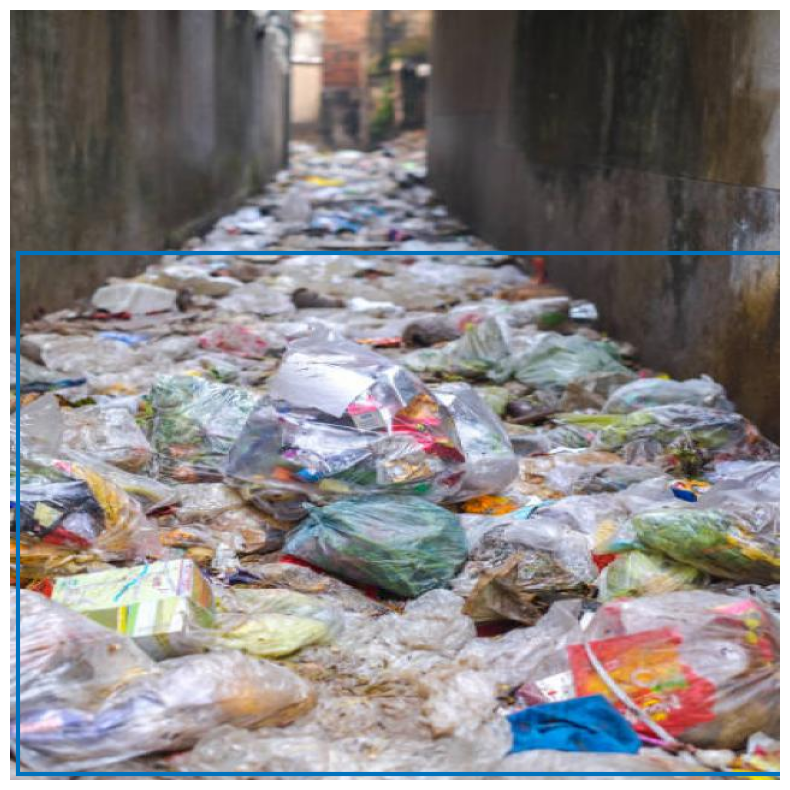

In [ ]:
# load image based on ID
image_id = target['image_id'].item()
image = val_dataset.coco.loadImgs(image_id)[0]
image = Image.open(os.path.join('data/valid', image['file_name']))

# postprocess model outputs
width, height = image.size
postprocessed_outputs = processor.post_process_object_detection(outputs,
                                                                target_sizes=[(height, width)],
                                                                threshold=0.9)
results = postprocessed_outputs[0]
plot_results(image, results['scores'], results['labels'], results['boxes'])

## Attention map

DETR is a model composed of mostly 2 components a CNN and a transformers built on top of it. So something we can try to do is take a look at the attention map of the transformer to see if they can be used to better intepret the model.

In [ ]:
for i in test_dataloader:
  img = i['pixel_values']
  break

In [ ]:
import matplotlib.pyplot as plt

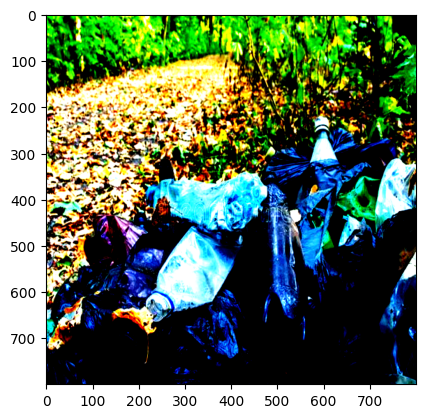

In [ ]:
plt.imshow(img[0].permute(1,2,0))

In [ ]:
enc_attn_weights.shape

torch.Size([2, 625, 625])

In [ ]:
def hook_conv(module, input, output):
  global conv_features
  conv_features = output

def hook_enc_attn(module, input, output):
  global enc_attn_weights
  enc_attn_weights = output[1]

def hook_dec_attn(module, input, output):
  global dec_attn_weights
  dec_attn_weights = output[1]

In [ ]:
img_1 = img[0]
img_1 = img_1.unsqueeze(0)

In [ ]:
# use lists to store the outputs via up-values
model.to(device)
conv_features, enc_attn_weights, dec_attn_weights = [], [], []

hooks = [
     model.model.backbone[-2].register_forward_hook(
        hook_conv),
    model.model.transformer.encoder.layers[-1].self_attn.register_forward_hook(
        hook_enc_attn),
    model.model.transformer.decoder.layers[-1].self_attn.register_forward_hook(
        hook_dec_attn),
]

# propagate through the model
outputs = model(img_1.to(device))

for hook in hooks:
    hook.remove()


In [ ]:
# standard PyTorch mean-std input image normalization
transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(800),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

In [ ]:
probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
keep = probas.max(-1).values > 0.5
# convert boxes from [0; 1] to image scales
bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep].cpu(),img_1.size()[-2:])

In [ ]:
# get the feature map shape
h, w = conv_features['0'].tensors.shape[-2:]

fig, axs = plt.subplots(ncols=len(bboxes_scaled), nrows=2, figsize=(22, 7))
#colors = COLORS * 100
for idx, ax_i, (xmin, ymin, xmax, ymax) in zip(keep.nonzero(), axs.T, bboxes_scaled.detach().numpy()):
    ax = ax_i[0]
    ax.imshow(enc_attn_weights[0, idx].view(25, 25).cpu().detach().numpy())
    ax.axis('off')
    ax.set_title(f'query id: {idx.item()}')
    ax = ax_i[1]
    ax.imshow(img_1.squeeze().permute(1,2,0).cpu().detach().numpy())
    ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                               fill=False, color='blue', linewidth=3))
    ax.axis('off')
    #ax.set_title(CLASSES[probas[idx].argmax()])
fig.tight_layout()

In [ ]:
model.to(device)

attention_maps = None

def hook_new(module, input, output):
    '''
    Funciton that in the forward pass of the model will trigger after computing
    the attention and return it's value to a global variable
    '''
    global attention_maps
    attention_maps = output[0]

# Attach hook to the self attention in the encoder
hook_layer = model.model.model.encoder.layers[0].self_attn
# And set the function to be trigged
hook_handle = hook_layer.register_forward_hook(hook_new)

# Forward of the model
image_tensor = sample['pixel_values'].clone().requires_grad_(True)
output = model(pixel_values=image_tensor, pixel_mask = sample['pixel_mask'])

# Detach the hook
hook_handle.remove()

# Access attention maps
attention_maps #= attention_maps.squeeze()
#attention_maps.backward()

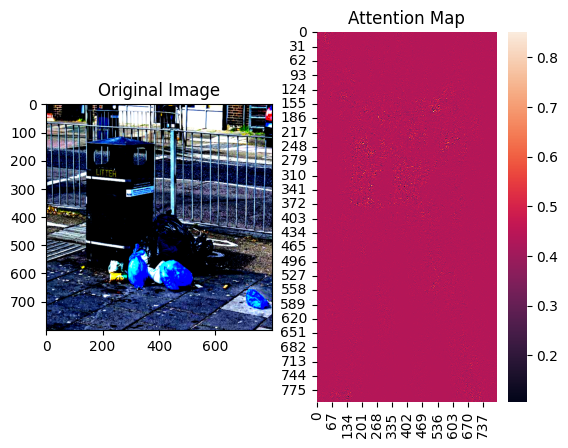

In [ ]:
# Get the gradients of the image
image_gradients = image_tensor.grad

# Normalize the gradients for visualization
image_gradients = (image_gradients - image_gradients.min()) / (image_gradients.max() - image_gradients.min())

# Convert the gradients to a NumPy array
image_gradients_np = image_gradients.squeeze().permute(1,2,0).detach().cpu().numpy()

# Plot the original image and the attention map
import matplotlib.pyplot as plt

plt.subplot(1, 2, 1)
plt.imshow(input_image)
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.title("Attention Map")
sns.heatmap(np.mean(image_gradients_np, axis = -1))
plt.show()
